## Wavelet Transform Analysis of 1D signals

- PyWavelet is a library for wavelet transforms in Python. It's dependencies are: NumPy, SciPy, and Matplotlib
- dwt, idwt, wavedec, waverec Python commands
- Discrete Wavelet Transform of an Audio Signal

With Anaconda:
- Quickly download 7,500+ Python/R data science packages.
- Manage libraries, dependencies, and environments with Conda.
- Develop and train machine learning and deep learning models with Scikit-learn, TensorFlow, and Theano
- Analyse data with scalability and performance with Dask, NumPy, Pandas, and Numba
- Visualize results with Matplotlib, Bokeh, Datashader, and Holoviews

### 1) Single Level Discrete Wavelet Transform and Inverse Transform

In [3]:
import pywt

x = [3, 7, 1, -1, -2, 5, 4, 6]  #signal
cA, cD = pywt.dwt(x, 'haar')  #Wavelet Transform

y = pywt.idwt(cA, cD, 'haar')  #inverse wavelet transfrom

print(cA)  #printing approximation coefficients
print(cD)  #printing detailed coefficients
print(y)  #printing reconstructed signal

[7.07106781 0.         2.12132034 7.07106781]
[-2.82842712  1.41421356 -4.94974747 -1.41421356]
[ 3.  7.  1. -1. -2.  5.  4.  6.]


###  2) Multi-Level Discrete Wavelet Transform and Inverse Transform

In [9]:
#coeffs = pywt.wavedec(x,'wavelet', mode='sym', level=n)
#wavelet = name of the wavelet
#mode = signalextension mode to deal with the border distortion problem (symmetric, periodic)
#level = number of wavelet decomposition levels

#if you do 3 level decomposition
#[cA3,cD3,cD2,cD1]=coeffs

#y = pywt.waverec(coeffs, 'wavelet', mode='sym')

#possible wavelet filters that can be used
print(pywt.wavelist())

['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'cgau1', 'cgau2', 'cgau3', 'cgau4', 'cgau5', 'cgau6', 'cgau7', 'cgau8', 'cmor', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7', 'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15', 'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28', 'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38', 'dmey', 'fbsp', 'gaus1', 'gaus2', 'gaus3', 'gaus4', 'gaus5', 'gaus6', 'gaus7', 'gaus8', 'haar', 'mexh', 'morl', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'shan', 'sym2', 'sym3

<img src="coeff.gif" width="400" height="200">

In [6]:
import pywt

x = [3, 7, 1, 1, -2, 5, 4, 6, 6, 4, 5, -2, 1, 1, 7, 3]

coeffs = pywt.wavedec(x, 'db1', level=2, mode='periodic')  #dwt
cA2, cD2, cD1 = coeffs

y = pywt.waverec(coeffs, 'db1', mode='periodic')  #idwt

print("cA2=", cA2)
print("cD2=", cD2)
print("cD1=", cD1)
print("Reconstructed Signal=", y)

cA2= [6.  6.5 6.5 6. ]
cD2= [ 4.  -3.5  3.5 -4. ]
cD1= [-2.82842712  0.         -4.94974747 -1.41421356  1.41421356  4.94974747
  0.          2.82842712]
Reconstructed Signal= [ 3.  7.  1.  1. -2.  5.  4.  6.  6.  4.  5. -2.  1.  1.  7.  3.]


### 3) Example Code for Wavelet Transform of an Audio Data

In [28]:
!pip install SoundFile

In [53]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import IPython.display as ipd
import soundfile as sf

In [24]:
voice_file ="voice.wav"
ipd.Audio(voice_file)


In [25]:
voice, sr = librosa.load(voice_file)
print(voice.size)
print("\n")
length_of_the_audio_file = voice.size / sr
print(length_of_the_audio_file)

661500


30.0


In [30]:
cA, cD = pywt.dwt(voice, 'bior6.8', 'per')  #DWT
y = pywt.idwt(cA, cD, 'bior6.8', 'per')  #IDWT


sf.write('voiceR.wav', y, sr)
sf.write('voice_cD.wav', cD, sr)

In [31]:
ipd.Audio('voiceR.wav')

In [32]:
ipd.Audio('voice_cD.wav')

In [37]:
librosa.load('voiceR.wav')[0]

array([-0.01156616, -0.01861572, -0.00018311, ..., -0.0322876 ,
        0.0234375 ,  0.05834961], dtype=float32)

(-1, 1)

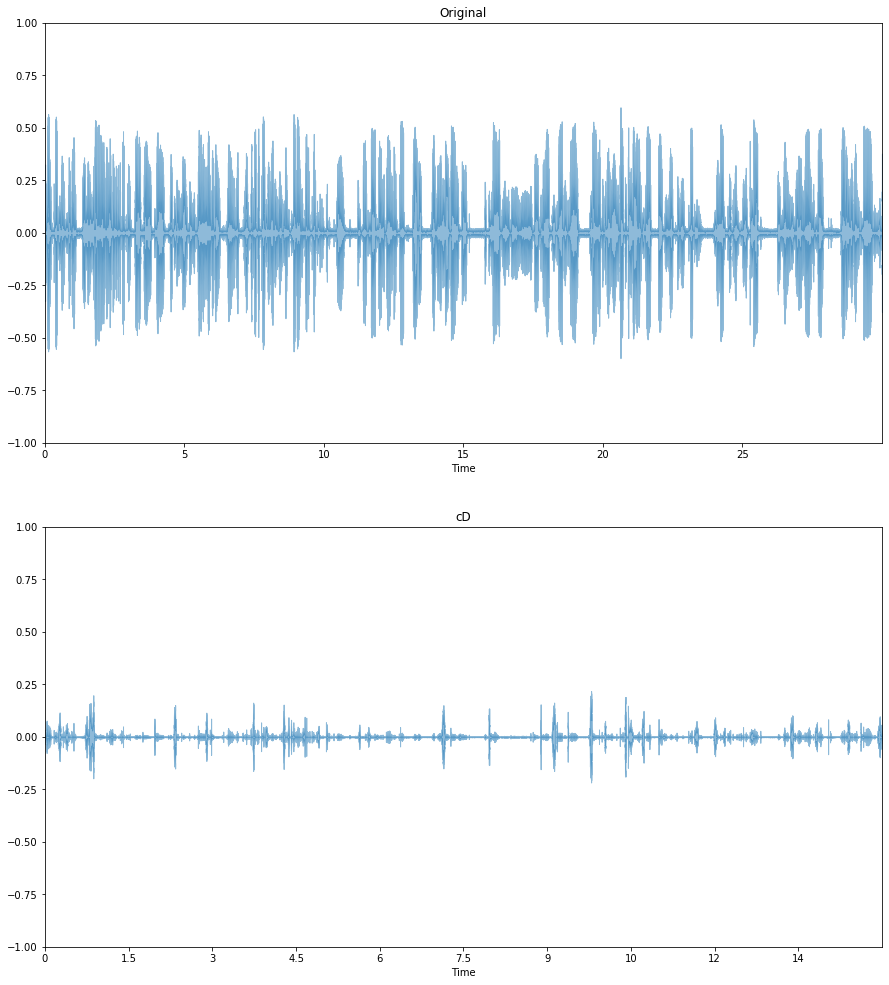

In [39]:
plt.figure(figsize=(15,17))

plt.subplot(2,1,1)
librosa.display.waveplot(np.array(librosa.load('voiceR.wav')[0]), alpha=0.5)
plt.title("Original")
plt.ylim((-1,1))


#high freq noise
plt.subplot(2,1,2)
librosa.display.waveplot(np.array(librosa.load('voice_cD.wav')[0]), alpha=0.5)
plt.title("cD")
plt.ylim((-1,1))

## Wavelet Based Denoising of 1D Signals 

Basic Assumptions for Noise Signal
- Noise is additive
- Noise is random signal (white gaussian noise with zero mean value)
- Noise is high frequency signal

y = denoise_wavelet(x,
                    wavelet='db1',
                    mode='soft',
                    wavelet_levels=n,
                    method='BayesShrink',
                    rescale_sigma='True')
                    
x = input noisy signal
y = denoised output
wavelet = name of wavelet used
mode = soft or hard
wavelet_levels = number of wavelet decomposition levels
method = 'BayesShrink' or 'VishuShrink'
rescale_sigma = 'True' or 'False'

In [41]:
!pip install -U scikit-image

     |████████████████████████████████| 30.2 MB 73 kB/s  eta 0:00:01
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.17.2
    Uninstalling scikit-image-0.17.2:
      Successfully uninstalled scikit-image-0.17.2


### 4) Example of Denoising of an ECG Signal

In [45]:
import numpy as np
import pywt
from skimage.restoration import denoise_wavelet
import matplotlib.pyplot as plt

(-1, 1)

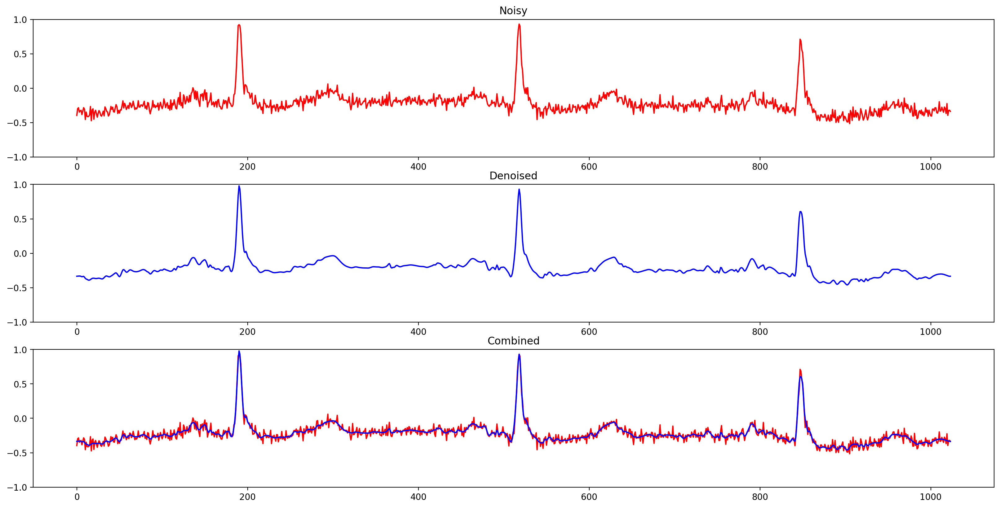

In [52]:
#in built ECG data is read
x = pywt.data.ecg().astype(float) / 256
#noise variance
sigma = 0.05
#adding noise to the signal
x_noisy = x + sigma * np.random.randn(x.size)

#wavelet denoising
x_denoise = denoise_wavelet(x_noisy,
                            method='BayesShrink',
                            mode='soft',
                            wavelet_levels=3,
                            wavelet='sym8',
                            rescale_sigma='True')

plt.figure(figsize=(20,10),dpi=200)

plt.subplot(3,1,1)
plt.plot(x_noisy,'r')
plt.title("Noisy")
plt.ylim((-1,1))

plt.subplot(3,1,2)
plt.plot(x_denoise,'b')
plt.title("Denoised")
plt.ylim((-1,1))

plt.subplot(3,1,3)
plt.plot(x_noisy,'r')
plt.plot(x_denoise,'b')
plt.title("Combined")
plt.ylim((-1,1))



### 5) Example of Denoising of an Audio Signal

In [54]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import IPython.display as ipd
import soundfile as sf

In [55]:
voice_file ="voice.wav"
ipd.Audio(voice_file)

In [56]:
voice, sr = librosa.load(voice_file)
print(voice.size)
print("\n")
length_of_the_audio_file = voice.size / sr
print(length_of_the_audio_file)

661500


30.0


(-1, 1)

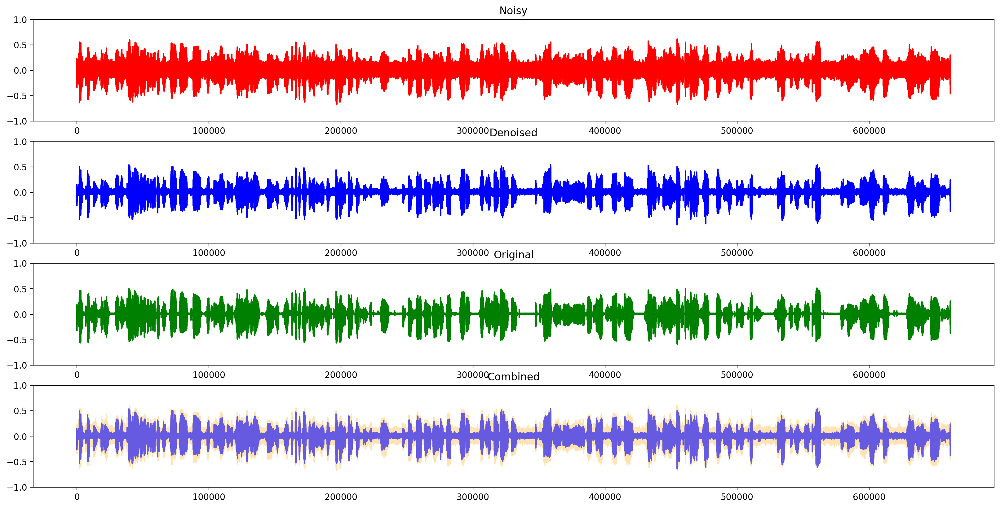

In [70]:
#noise variance
sigma = 0.05
#adding noise to the signal
voice_noisy = voice + sigma * np.random.randn(voice.size)
#wavelet denoising
voice_denoise = denoise_wavelet(voice_noisy,
                                method='VisuShrink',
                                mode='soft',
                                wavelet_levels=3,
                                wavelet='sym8',
                                rescale_sigma='True')

plt.figure(figsize=(20, 10), dpi=200)

plt.subplot(4, 1, 1)
plt.plot(voice_noisy, 'r')
plt.title("Noisy")
plt.ylim((-1, 1))

plt.subplot(4, 1, 2)
plt.plot(voice_denoise, 'b')
plt.title("Denoised")
plt.ylim((-1, 1))

plt.subplot(4, 1, 3)
plt.plot(voice, 'g')
plt.title("Original")
plt.ylim((-1, 1))

plt.subplot(4, 1, 4)
plt.plot(voice_noisy, 'orange', alpha=0.3)
plt.plot(voice_denoise, 'b', alpha=0.6)
plt.title("Combined")
plt.ylim((-1, 1))

In [71]:
sf.write('voice_noisy.wav', voice_noisy, sr)
sf.write('voice_denoised.wav', voice_denoise, sr)

In [76]:
voice_file_noisy ='voice_noisy.wav'
ipd.Audio(voice_file_noisy)

In [77]:
voice_file_denoised ='voice_denoised.wav'
ipd.Audio(voice_file_denoised)